In [6]:
import pandas as pd

def load_dqm_df(filename):
    df_dict = {}
    with pd.HDFStore(filename, 'r') as store:

        # Loop through each key
        for key in store.keys():
            my_key = key[1:]  # remove front '/'
            if my_key not in df_dict:
                df_dict[my_key] = []
            try:
                df_dict[my_key].append(store[key])
            except Exception as e:
                print(f"Could not load key {key} : {e}")

    return df_dict

In [8]:
df = load_dqm_df("/nfs/home/sbhuller/fddaq-v5.3.2-rc3-a9/test_vd.hdf5")
print(df.keys())

Could not load key /sid : No module named 'daqdataformats'
Could not load key /trgd_kDAQ_kTriggerCandidate : No module named 'trgdataformats'
Could not load key /trh : No module named 'trgdataformats'
dict_keys(['daqh', 'detd_kVD_BottomTPC_kWIBEth', 'deth_kVD_BottomTPC_kWIBEth', 'detw_kVD_BottomTPC_kWIBEth', 'frh', 'sid', 'trgd_kDAQ_kTriggerCandidate', 'trgh_kDAQ_kTriggerCandidate', 'trh'])


In [21]:
import matplotlib.pyplot as plt
import numpy as np

key_name = "detw_kVD_BottomTPC_kWIBEth"

adc_df = df[key_name][0].adcs
plane = df[key_name][0].plane
element = df[key_name][0].element
adc = np.array([a.tolist() for a in adc_df.values])

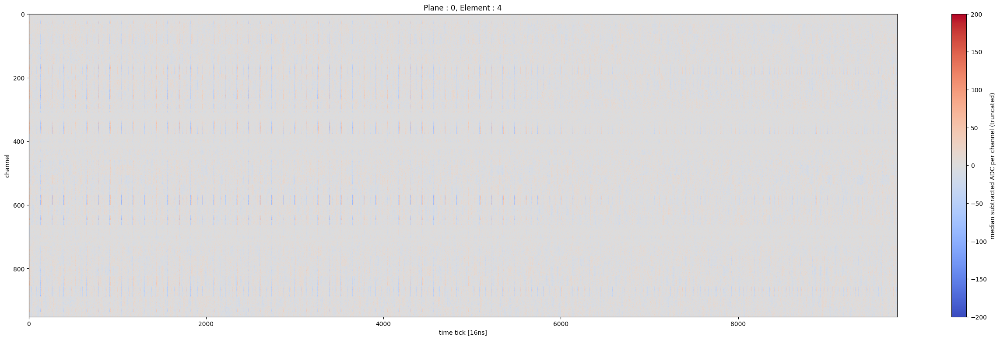

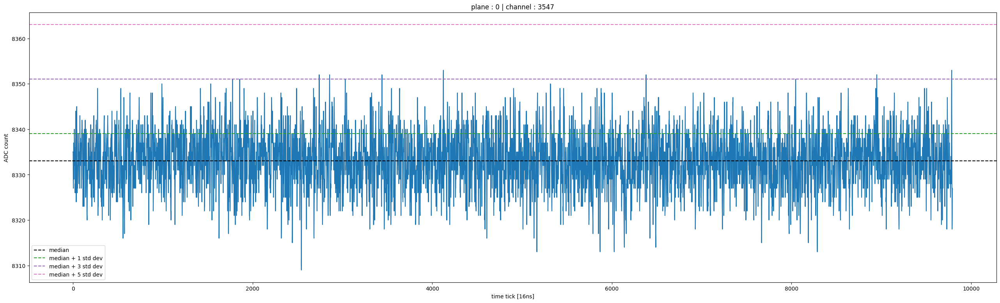

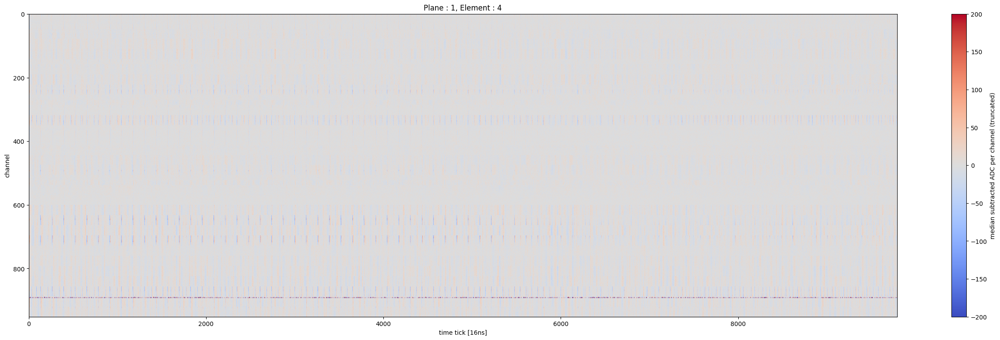

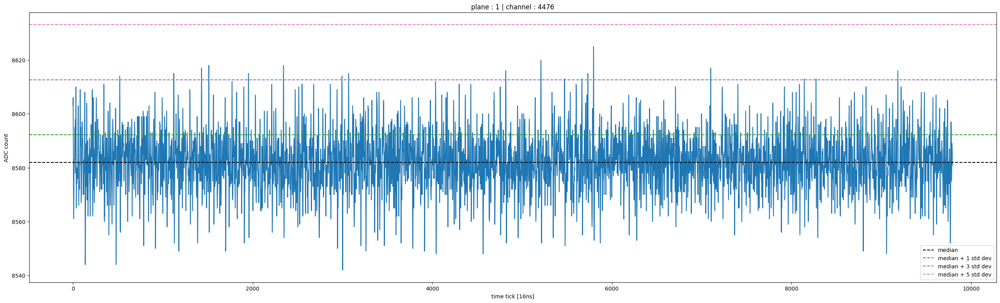

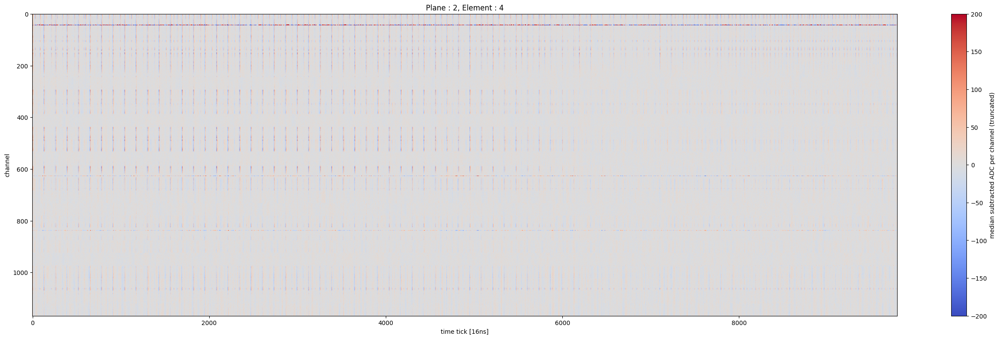

...

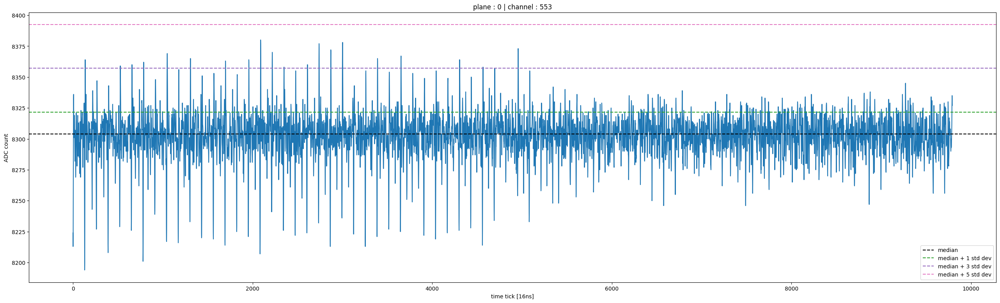

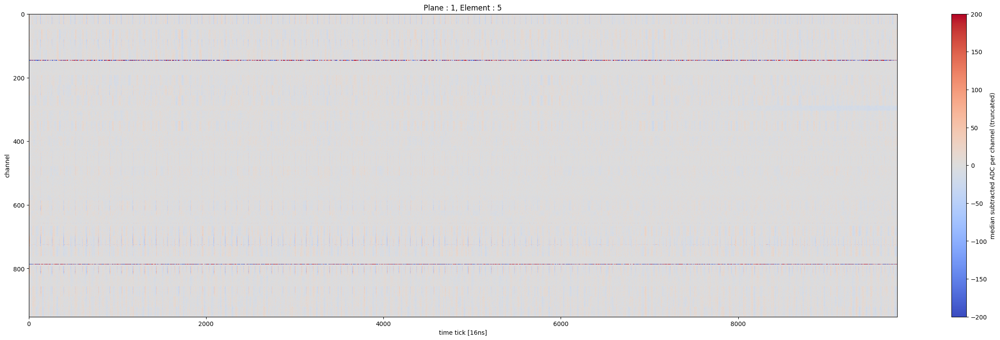

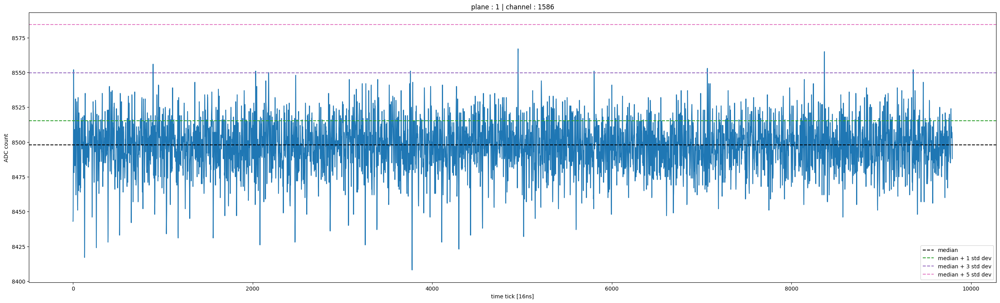

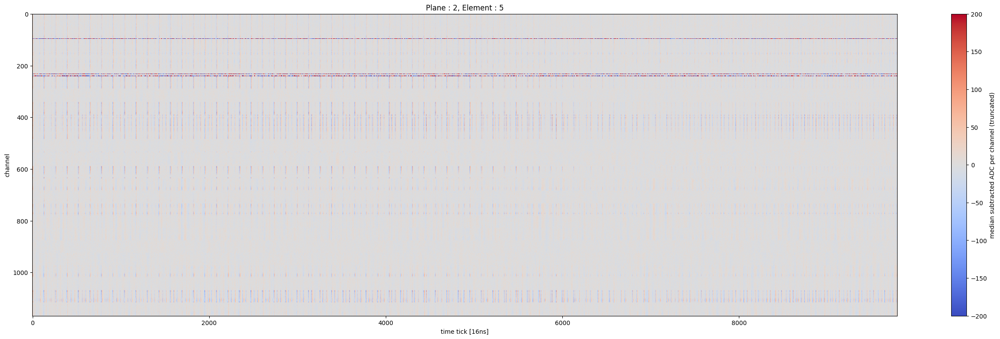

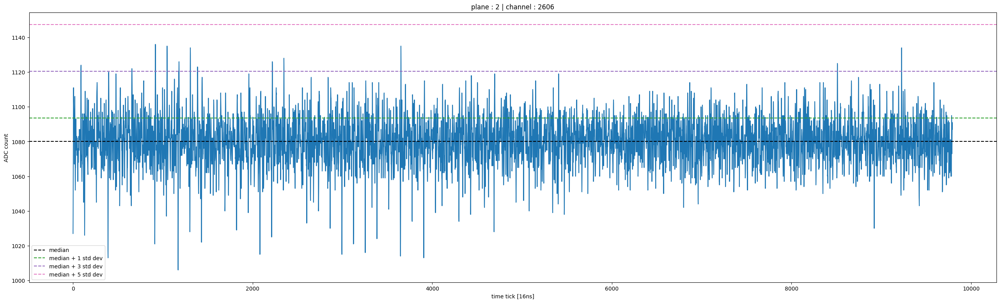

In [27]:
for e in np.unique(element):
    for p in np.unique(plane):
        mask = (plane.values == p) & (element.values == e)

        adc_tmp = adc[mask]
        med = np.median(adc_tmp, axis = 1)
        std = np.std(adc_tmp, axis = 1)

        med_sub = (adc_tmp.T - med).T

        plt.figure(figsize = (32, 9))
        plt.imshow(med_sub, aspect = "auto", cmap = "coolwarm", vmin = (-200, 200))
        plt.colorbar(label = "median subtracted ADC per channel (truncated)")
        plt.xlabel("time tick [16ns]")
        plt.ylabel("channel")
        plt.title(f"Plane : {p}, Element : {e}")

        for i in range(1):
            plt.figure(figsize = (32, 9))
            plt.plot(adc_tmp[i])
            plt.xlabel("time tick [16ns]")
            plt.ylabel("ADC count")
            plt.axhline(med[i], color = "k", linestyle = "--", label = "median")

            for j in [1, 3, 5]:
                plt.axhline(med[i] + j * std[i], color = f"C{1 + j}", linestyle = "--", label = f"median + {j} std dev")

            plt.title(f'plane : {p} | channel : {adc_df.index.get_level_values("channel")[mask][i]}')
            plt.legend()

In [34]:

plane[plane.index.get_level_values('channel') == 5200]


run    trigger  sequence  src_id  channel
36970  1        0         428     5200       2
Name: plane, dtype: int64